In [2]:
import tensorflow as tf

print(f"tensorflow GPU version: {tf.__version__}")

tensorflow GPU version: 2.1.0


In [3]:
from tensorflow.keras.layers import Input, Reshape, Dropout, Dense 
from tensorflow.keras.layers import Flatten, BatchNormalization
from tensorflow.keras.layers import Activation, ZeroPadding2D
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import UpSampling2D, Conv2D
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.optimizers import Adam
import numpy as np
from PIL import Image
from tqdm import tqdm
import os 
import time
import matplotlib.pyplot as plt
import datetime
# from autoencoder import Denoise
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, losses
# from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import Model
import cv2
import time
import string
import requests
import urllib.request
from PIL import Image
from tqdm import tqdm

from utils import *

Using TensorFlow backend.


In [4]:
# Nicely formatted time string
def hms_string(sec_elapsed):
    h = int(sec_elapsed / (60 * 60))
    m = int((sec_elapsed % (60 * 60)) / 60)
    s = sec_elapsed % 60
    return "{}:{:>02}:{:>05.2f}".format(h, m, s)

In [5]:
gpus = tf.config.experimental.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(gpus[0], True)
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available:  1


In [6]:
# Generation resolution - Must be square 
# Training data is also scaled to this.
# Note GENERATE_RES 4 or higher  
# will blow Google CoLab's memory and have not
# been tested extensivly.
GENERATE_RES = 3 # Generation resolution factor 
# (1=32, 2=64, 3=96, 4=128, etc.)
GENERATE_SQUARE = 224*2 # rows/cols (should be square)
IMAGE_CHANNELS = 3

# Preview image 
PREVIEW_ROWS = 4
PREVIEW_COLS = 7
PREVIEW_MARGIN = 16

# Size vector to generate images from
SEED_SIZE = 100

# Configuration
DATA_PATH = 'Data/Dataset1000/Train/'
EPOCHS = 100
BATCH_SIZE = 2
BUFFER_SIZE = 60000

print(f"Will generate {GENERATE_SQUARE}px square images.")

Will generate 448px square images.


In [7]:

# Image set has 11,682 images.  Can take over an hour 
# for initial preprocessing.
# Because of this time needed, save a Numpy preprocessed file.
# Note, that file is large enough to cause problems for 
# sume verisons of Pickle,
# so Numpy binary files are used.
training_binary_path = os.path.join(DATA_PATH,
        f'C:/Users/lomia/All_Projects/WatermarkRemover/Pickle/training_data_{GENERATE_SQUARE}_{GENERATE_SQUARE}.npy')
# np.save(training_binary_path,np.array([]))
print(f"Looking for file: {training_binary_path}")

if not os.path.isfile(training_binary_path):
  start = time.time()
  print("Loading training images...")

  training_data = []
  clean_path = os.path.join(DATA_PATH,'WM_Images/watermark')
  wm_path = os.path.join(DATA_PATH,'Original_Ims/original')
  i = 0
  for filename in tqdm(os.listdir(clean_path)):
      training_data.append([])
      cln = os.path.join(clean_path,filename)
      wm = os.path.join(wm_path,filename)

      wm_image = Image.open(wm).resize((GENERATE_SQUARE, GENERATE_SQUARE),Image.ANTIALIAS)
      cln_image = Image.open(cln).resize((GENERATE_SQUARE, GENERATE_SQUARE),Image.ANTIALIAS)
      
      training_data[i].append(np.asarray(cln_image))
      training_data[i].append(np.asarray(wm_image))
      
      i+=1
  training_data = np.array(training_data)
  training_data = training_data.astype(np.float32)
  training_data = training_data / 255.

  print(training_data.shape)
  print("Saving training image binary...")

  np.save(training_binary_path,training_data)
  elapsed = time.time()-start
  print (f'Image preprocess time: {hms_string(elapsed)}')

else:
  
  print("Loading previous training pickle...")
  training_data = np.load(training_binary_path)

  0%|          | 2/1200 [00:00<01:02, 19.28it/s]Looking for file: C:/Users/lomia/All_Projects/WatermarkRemover/Pickle/training_data_448_448.npy
Loading training images...
100%|██████████| 1200/1200 [00:43<00:00, 27.63it/s]
(1200, 2, 448, 448, 3)
Saving training image binary...
Image preprocess time: 0:00:57.64


In [8]:
# Batch and shuffle the data

train_dataset = tf.data.Dataset.from_tensor_slices(training_data).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
print(train_dataset)

<BatchDataset shapes: (None, 2, 448, 448, 3), types: tf.float32>


In [9]:

class Denoise(Model):
  def __init__(self, in_shp):
    super(Denoise, self).__init__()
    self.encoder = tf.keras.Sequential([
      layers.Input(shape=(in_shp, in_shp, 3)),
      layers.Conv2D(256, (3,3), activation='relu', padding='same', strides=2),
      layers.Conv2D(128, (3,3), activation='relu', padding='same', strides=2),
      layers.Conv2D(64, (3,3), activation='relu', padding='same', strides=2),
      layers.Conv2D(32, (3,3), activation='relu', padding='same', strides=2),
      ])

    self.decoder = tf.keras.Sequential([

      layers.Conv2DTranspose(32, kernel_size=3, strides=2, activation='relu', padding='same'),
      layers.Conv2DTranspose(64, kernel_size=3, strides=2, activation='relu', padding='same'),
      layers.Conv2DTranspose(128, kernel_size=3, strides=2, activation='relu', padding='same'),
      layers.Conv2DTranspose(256, kernel_size=3, strides=2, activation='relu', padding='same'),
      layers.Conv2D(3, kernel_size=(3,3), activation='sigmoid', padding='same')
      ])
    
    
  def call(self, x):
    encoded = self.encoder(x)
    decoded = self.decoder(encoded)
    return decoded

In [10]:
def build_discriminator(image_shape):
    model = Sequential()

    model.add(Conv2D(32, kernel_size=3, strides=2, input_shape=image_shape, 
                     padding="same"))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Dropout(0.25))
    model.add(Conv2D(64, kernel_size=3, strides=2, padding="same"))
    model.add(ZeroPadding2D(padding=((0,1),(0,1))))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Dropout(0.25))
    model.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Dropout(0.25))
    model.add(Conv2D(256, kernel_size=3, strides=1, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Dropout(0.25))
    model.add(Conv2D(512, kernel_size=3, strides=1, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Dropout(0.25))
    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))

    return model

In [11]:
def root_mean_squared_error(y_true, y_pred):
        return tf.keras.backend.sqrt(tf.keras.backend.mean(tf.keras.backend.square(y_pred - y_true))) 

def get_random_string(length):
    letters = string.ascii_lowercase
    result_str = ''.join(rnd.choice(letters) for i in range(length))
    return result_str

In [12]:
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
test_away_gen = train_datagen.flow_from_directory(
    directory="Data/Dataset1000/Test/WM_Images/",
    target_size=(GENERATE_SQUARE, GENERATE_SQUARE),
    color_mode="rgb",
    batch_size=BATCH_SIZE,
    class_mode="input",
    shuffle=True)

Found 76 images belonging to 1 classes.


In [13]:
def generate_layer_outputs(model, data, layer_num):

    layer_outputs = [layer.output for layer in model.layers[:layer_num]]

    # print(len(layer_outputs))

    activation_model = Model(inputs=model.input, outputs=layer_outputs)
    activations = activation_model.predict(data)

    return activations
 
def display_activation(activations, col_size, row_size, act_index): 
    activation = activations[act_index]
    print(len(activation))
    activation_index=0
    fig, ax = plt.subplots(row_size, col_size, figsize=(row_size*12.5,col_size*11.5))

    for row in range(0,row_size):
        for col in range(0,col_size):
            ax[row][col].imshow(activation[0, :, :, activation_index])
            activation_index += 1

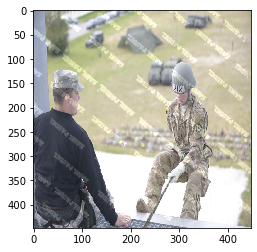

In [14]:
data_list = []
batch_index = 0

data = test_away_gen.next()
data_list.append(data[1][:-BATCH_SIZE+1])
plt.imshow(data[1][0])

In [15]:
generator = Denoise(GENERATE_SQUARE)
generator.compile(optimizer='adam', loss=root_mean_squared_error)

In [16]:
weight_path = "Weights/20200915-225635/_pretrained_weights0005.h5"
generator.build((1,GENERATE_SQUARE,GENERATE_SQUARE,3))
generator.load_weights(weight_path)

In [17]:
encoder_output = generate_layer_outputs(generator.encoder, data_list[0], 4)
# print(len(encoder_output))
fig1 = display_activation(encoder_output, 16, 8, 0)

# display_activation(encoder_output, 4, 8, 3)
# print(encoder_output)
# print(encoder_output)
# decoder = generate_layer_outputs(generator.decoder,data_list[0])

1


In [18]:
fig2 = display_activation(encoder_output, 16, 8, 1)


1


1


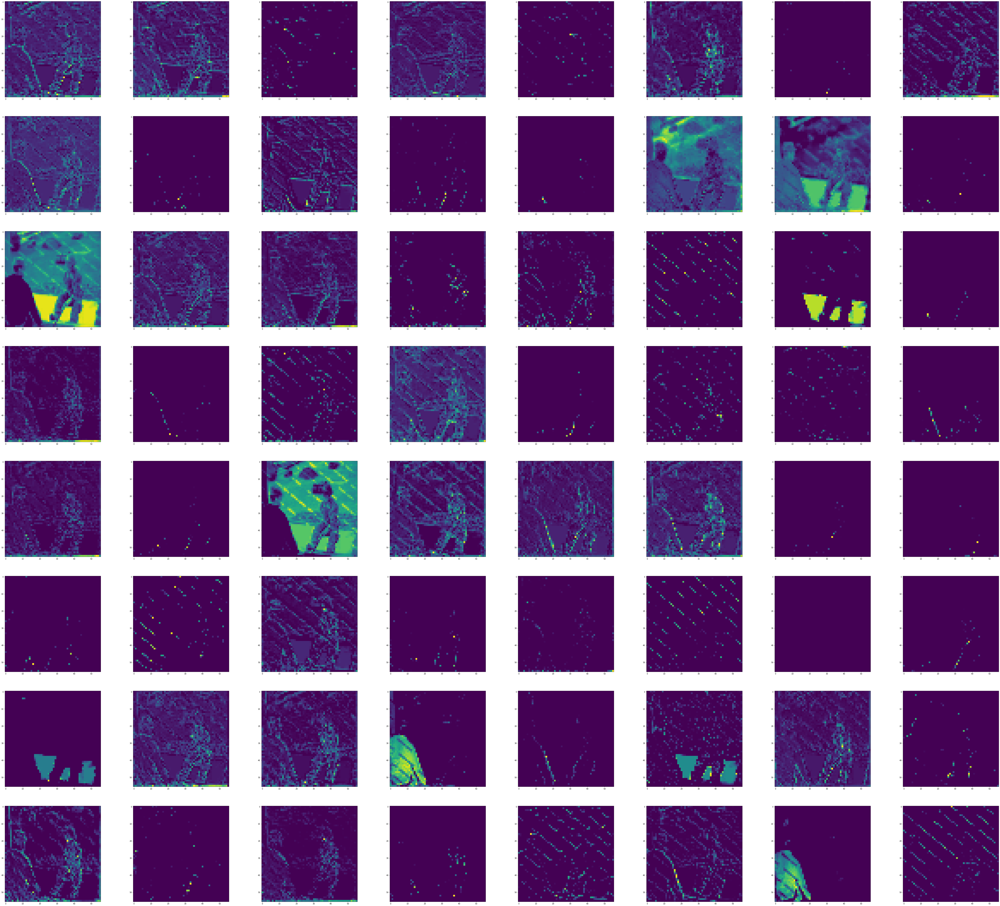

In [19]:
fig3 = display_activation(encoder_output, 8, 8, 2)


1


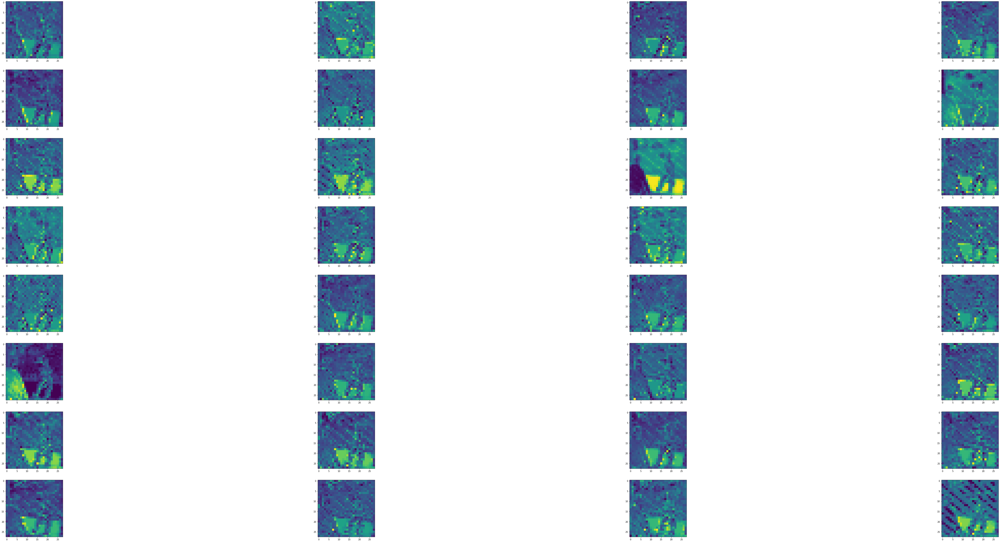

In [20]:
fig4 = display_activation(encoder_output, 4, 8, 3)

In [21]:
# Batch and shuffle the data
train_dataset = tf.data.Dataset.from_tensor_slices(training_data).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
print(train_dataset)

<BatchDataset shapes: (None, 2, 448, 448, 3), types: tf.float32>


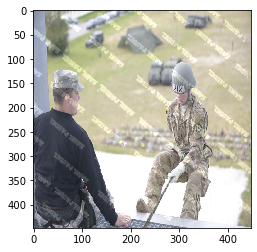

In [22]:

predicted = generator.predict(data_list[0])
predicted_twice = generator.predict(predicted)
predicted_thrice = generator.predict(predicted_twice)
plt.imshow(data[1][0])

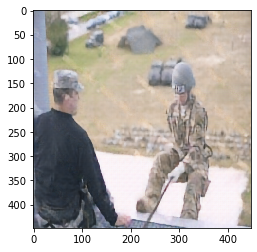

In [23]:
plt.imshow(predicted[0])

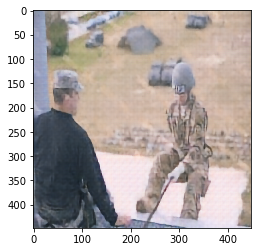

In [24]:
plt.imshow(predicted_twice[0])

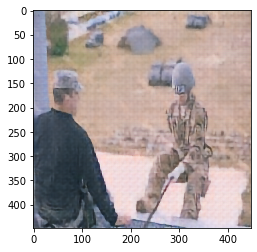

In [25]:
plt.imshow(predicted_thrice[0])

In [26]:
rnd_string = get_random_string(10)
print(rnd_string)
cv2.imwrite(f"Output/im_{rnd_string}_original.png", cv2.cvtColor(data[1][0]*255., cv2.COLOR_RGB2BGR))
cv2.imwrite(f"Output/im_{rnd_string}_1.png", cv2.cvtColor( predicted[0]*255., cv2.COLOR_RGB2BGR))
cv2.imwrite(f"Output/im_{rnd_string}_2.png", cv2.cvtColor( predicted_twice[0]*255., cv2.COLOR_RGB2BGR))
cv2.imwrite(f"Output/im_{rnd_string}_3.png", cv2.cvtColor( predicted_thrice[0]*255., cv2.COLOR_RGB2BGR))

ctssfazceh


True

In [27]:
image_shape = (GENERATE_SQUARE,GENERATE_SQUARE,IMAGE_CHANNELS)

discriminator = build_discriminator(image_shape)
decision = discriminator(predicted)
print (decision)

tf.Tensor([[0.49891648]], shape=(1, 1), dtype=float32)


In [28]:
# This method returns a helper function to compute cross entropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output) # If we feed the discriminator with real images, we assume they all are the right pictures --> Because of that label == 1
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)  # Each noise we feed in are fakes image --> Because of that labels are 0
    total_loss = real_loss + fake_loss 
    return total_loss

def generator_loss(fake_output):
    # As well as "fooling" the discriminator, we want particular pressure on ground-truth accuracy
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [29]:

generator_optimizer = tf.keras.optimizers.Adam(1.5e-4,0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(1.5e-4,0.5)

In [30]:
def extract_X_Y(images):

    shp = (images.shape)
    X, Y= tf.split(images, num_or_size_splits=2, axis = 1)

    X = tf.reshape(X,(shp[0], shp[2], shp[3], shp[4]))
    Y = tf.reshape(Y,(shp[0], shp[2], shp[3], shp[4]))

    return X, Y

In [31]:
# Notice the use of `tf.function`
# This annotation causes the function to be "compiled".
# @tf.function
def train_step(images):
        
  shp = (images.shape)
  X , Y= extract_X_Y(images)

  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    generated_images = generator(X, training=True, )

    real_output = discriminator(Y, training=True)
    fake_output = discriminator(generated_images, training=True)

    gen_loss = generator_loss(fake_output)
    disc_loss = discriminator_loss(real_output, fake_output)
    

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))


  return gen_loss,disc_loss

In [32]:
def train(dataset, epochs, BATCH_SIZE):
  fixed_seed = np.random.normal(0, 1, (PREVIEW_ROWS * PREVIEW_COLS, 
                                       SEED_SIZE))
  start = time.time()

  for epoch in range(epochs):
    epoch_start = time.time()

    gen_loss_list = []
    disc_loss_list = []

    batch_num = 0
    for image_batch in dataset:
      t = train_step(image_batch)
      batch_num +=1
      print(f"This batch is {batch_num/len(image_batch)}% Done")
      gen_loss_list.append(t[0])
      disc_loss_list.append(t[1])

    g_loss = sum(gen_loss_list) / len(gen_loss_list)
    d_loss = sum(disc_loss_list) / len(disc_loss_list)

    epoch_elapsed = time.time()-epoch_start
    print (f'Epoch {epoch+1}, gen loss={g_loss},disc loss={d_loss}, {hms_string(epoch_elapsed)}')
    
    time_stamp = time.strftime("%Y%m%d-%H%M%S")
    checkpoint_dir = f'GAN_Weights\\{time_stamp}\\'
    os.makedirs(checkpoint_dir, exist_ok=True)

    os.makedirs(f'GAN_Weights\\{time_stamp}\\Generator', exist_ok=True)
    os.makedirs(f'GAN_Weights\\{time_stamp}\\Discriminator', exist_ok=True)

    generator.save_weights(f'GAN_Weights\\{time_stamp}\\Generator\\loss_{g_loss}.h5')
    discriminator.save_weights(f'GAN_Weights\\{time_stamp}\\Discriminator\\loss_{d_loss}.h5')
    
  elapsed = time.time()-start
  print (f'Training time: {hms_string(elapsed)}')

In [34]:
train(train_dataset, EPOCHS, BATCH_SIZE)

This batch is 0.5% Done
This batch is 1.0% Done
This batch is 1.5% Done
This batch is 2.0% Done
This batch is 2.5% Done
This batch is 3.0% Done
This batch is 3.5% Done
This batch is 4.0% Done
This batch is 4.5% Done
This batch is 5.0% Done
This batch is 5.5% Done
This batch is 6.0% Done
This batch is 6.5% Done
This batch is 7.0% Done
This batch is 7.5% Done
This batch is 8.0% Done
This batch is 8.5% Done
This batch is 9.0% Done
This batch is 9.5% Done
This batch is 10.0% Done
This batch is 10.5% Done
This batch is 11.0% Done
This batch is 11.5% Done
This batch is 12.0% Done
This batch is 12.5% Done
This batch is 13.0% Done
This batch is 13.5% Done
This batch is 14.0% Done
This batch is 14.5% Done
This batch is 15.0% Done
This batch is 15.5% Done
This batch is 16.0% Done
This batch is 16.5% Done
This batch is 17.0% Done
This batch is 17.5% Done
This batch is 18.0% Done
This batch is 18.5% Done
This batch is 19.0% Done
This batch is 19.5% Done
This batch is 20.0% Done
This batch is 20.5%

KeyboardInterrupt: 